In [1]:
import pandas as pd
import os
%matplotlib inline


from numpy import nan
import pandas as pd
from pandas import (DataFrame, date_range)
import matplotlib.pyplot as plt
import alphalens
import numpy as np
import datetime
import copy
import xlsxwriter
os.chdir('/Users/arthur/Desktop/factor_investment')

In [2]:
from alphalens.tears import (create_returns_tear_sheet,
                      create_information_tear_sheet,
                      create_turnover_tear_sheet,
                      create_summary_tear_sheet,
                      create_full_tear_sheet,
                      create_event_returns_tear_sheet,
                      create_event_study_tear_sheet)

from alphalens.utils import get_clean_factor_and_forward_returns

In [3]:
with open('./data/2022_utf8.csv', 'r') as infile:
    c = pd.read_csv(infile, low_memory=False)

# file = open('./data/TEJ_UTF8.csv', 'r', encoding='utf8')
# price_df = pd.read_csv(file, sep=',', encoding_errors='ignore')

col_list = ["證券代碼", "簡稱", "年月日", "收盤價(元)"]
price_df = pd.read_csv('./data/TEJ_StockPrice_20052022.csv', encoding='big5', encoding_errors='ignore', usecols=col_list)
price_df["證券代碼"] = [str(x).strip() for x in price_df["證券代碼"]]
price_df["簡稱"] = [x.strip() for x in price_df["簡稱"]]

with open("./data/StockValidation.csv", 'r') as file:
    validstock_df = pd.read_csv(file, sep=',', low_memory=False, index_col=0)
    validstock_df['stock_id'] = validstock_df['stock_id'].astype('str')

candidatePoolDF=pd.read_excel('./計算溢酬/CTBCdata/10個因子原始資料.xlsx','125檔', dtype=str,index_col=0,header=1)
# print(c.head())
# print(c.shape)

/var/folders/w8/jwxq4stj29506b1pf67xpb000000gq/T/ipykernel_847/2475575815.py:8: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  price_df = pd.read_csv('./data/TEJ_StockPrice_20052022.csv', encoding='big5', encoding_errors='ignore', usecols=col_list)


In [4]:
# 篩掉財報發佈日na值 更改資料型態

c = c[c.財報發布日.isna() == False]
c = c.reset_index(drop=True)

for i in range(c.shape[0]):
    c.loc[i, "證券代碼"] = c.loc[i, "證券代碼"][0:4]

In [5]:
c.loc[c.證券代碼.isin( validstock_df.iloc[:, 0].astype('str') ), ]
price_df = price_df.loc[price_df.證券代碼.isin( validstock_df.iloc[:, 0] ), ]

c = c.reset_index(drop=True)
price_df = price_df.reset_index(drop=True)

In [6]:
c['年月'] = pd.to_datetime(c['年月']).dt.date
c['財報發布日'] = pd.to_datetime(c['財報發布日']).dt.date
price_df['年月日'] = pd.to_datetime(price_df['年月日']).dt.date

In [7]:
# 篩選prices裡面才有的股票
# 篩選2010年後的資料

df_report = c # df_report = c[c.證券代碼.isin( prices.columns.astype(str) )]
df_report = df_report[df_report.年月 > datetime.date(2010, 1, 1)]
# df_report.證券代碼 = df_report.證券代碼.astype(int)
df_report = df_report.reset_index(drop=True)
df_report

,證券代碼,年月,季別,合併(Y/N),月份,幣別,現金及約當現金,透過損益按公允價值衡量之金融資產－流動,透過其他綜合損益按公允價值衡量之金融資產－流動,按攤銷後成本衡量之金融資產－流動,...,財報發布日,財報類別（1個別2個體3合併）,財報年月起日,財報年月迄日,市場別,交易所主產業代碼,交易所子產業代碼,TEJ主產業代碼,TEJ子產業代碼,財報附註TEJ是否完成Y/N
0,1101,2021-12-01,4,Y,12,NTD,91121942.0,363813.0,6387543.0,15508688.0,...,2022-02-25,3.0,2021/01,2021/12,TSE,M1100,M1100,11A,11A,Y
1,1110,2021-12-01,4,Y,12,NTD,419504.0,248685.0,0.0,0.0,...,2022-03-18,3.0,2021/01,2021/12,TSE,M1100,M1100,11A,11A,N
2,1216,2021-12-01,4,Y,12,NTD,80837880.0,10394193.0,0.0,15300236.0,...,2022-03-09,3.0,2021/01,2021/12,TSE,M1200,M1200,12C,12C,Y
3,1229,2021-12-01,4,Y,12,NTD,2785515.0,103474.0,666216.0,0.0,...,2022-03-15,3.0,2021/01,2021/12,TSE,M1200,M1200,12B,12B,Y
4,1231,2021-12-01,4,Y,12,NTD,327180.0,297223.0,0.0,0.0,...,2022-03-10,3.0,2021/01,2021/12,TSE,M1200,M1200,12Z,12Z,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92150,9955,2010-03-01,1,Y,3,NTD,1177382.0,0.0,0.0,0.0,...,2010-04-30,3.0,2010/01,2010/03,TSE,M9900,M9900,99L,99L1,Y
92151,9958,2010-03-01,1,N,3,NTD,178773.0,0.0,0.0,0.0,...,2010-04-29,1.0,2010/01,2010/03,TSE,M2000,M2000,20A,20A2,Y
92152,9960,2010-03-01,1,Y,3,NTD,216698.0,0.0,53658.0,0.0,...,2010-04-28,3.0,2010/01,2010/03,OTC,M2900,M2900,29A,29A1,Y
92153,9962,2010-03-01,1,Y,3,NTD,38264.0,0.0,0.0,0.0,...,2010-04-27,3.0,2010/01,2010/03,OTC,M2000,M2000,20A,20A6,Y


In [8]:
import warnings
warnings.filterwarnings("ignore")

prices = pd.DataFrame()
for i in range(price_df.shape[0]):
    date = price_df.loc[i, '年月日']
    coid = price_df.loc[i, '證券代碼']
    prices.loc[date, coid] = price_df.loc[i, '收盤價(元)']
#     if (i % 10000) == 0:
#         print(i)

warnings.filterwarnings("default")

In [9]:
print(min(df_report.財報發布日))
print(max(df_report.財報發布日))
print(min(prices.index))
print(max(prices.index))

2010-03-03
2022-03-21
2005-01-03
2022-05-16


In [10]:
index = pd.Index(pd.date_range(start="2010-03-03", end="2022-03-21"))

In [11]:
print(len(np.unique(np.array(df_report.loc[:, "證券代碼"]))))
print(df_report.shape)
print(prices.shape)

prices.index = pd.to_datetime(prices.index)
df_report.財報發布日 = pd.to_datetime(df_report.財報發布日)

df_report = df_report[ df_report.證券代碼 . isin(prices.columns)]
df_report = df_report[ pd.to_datetime(df_report.財報發布日) . isin(index) ].reset_index(drop=True)
prices = prices.loc[:, prices.columns.isin(df_report.證券代碼)]
prices = prices[ prices.index.isin(index) ]

print(len(np.unique(np.array(df_report.loc[:, "證券代碼"]))))
print(df_report.shape)
print(prices.shape)

2877
(92155, 804)
(4281, 1209)
1103
(45725, 804)
(2966, 1103)


In [12]:
for i in index:
    if i in prices.index:
        continue
    else:
        prices.loc[i, :] = [nan]*1103

prices = prices.sort_index()
prices = prices.fillna(method='ffill')

In [13]:
tickers = np.unique(np.array(df_report.loc[:, "證券代碼"]))

In [14]:
print(df_report.shape)
print(prices.shape)

(45725, 804)
(4402, 1103)


In [15]:
prices = prices.sort_index(axis=1)
prices

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2010-03-03,12.7010,14.5403,9.5058,8.2537,5.3702,6.5762,9.5700,30.6630,14.9392,10.8688,...,14.2990,34.40,18.3189,15.1479,14.3827,4.8562,17.7091,46.3958,9.6831,8.2819
2010-03-04,12.5548,14.4201,9.5999,8.3062,5.5040,6.6097,10.1961,30.2497,14.8481,10.7157,...,14.2236,34.35,18.1334,14.6627,14.2580,4.8749,17.2959,45.8774,9.6831,8.2476
2010-03-05,12.5130,14.4201,9.5685,8.2537,5.5180,6.6433,10.3750,30.8283,15.0000,10.7667,...,14.2990,35.50,18.1334,14.7975,14.4184,4.8189,17.5616,46.0502,9.8266,8.3161
2010-03-06,12.5130,14.4201,9.5685,8.2537,5.5180,6.6433,10.3750,30.8283,15.0000,10.7667,...,14.2990,35.50,18.1334,14.7975,14.4184,4.8189,17.5616,46.0502,9.8266,8.3161
2010-03-07,12.5130,14.4201,9.5685,8.2537,5.5180,6.6433,10.3750,30.8283,15.0000,10.7667,...,14.2990,35.50,18.1334,14.7975,14.4184,4.8189,17.5616,46.0502,9.8266,8.3161
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-17,48.0000,48.0000,20.4500,21.2500,11.8500,20.4000,20.2500,21.9000,33.7000,51.3574,...,35.8000,218.00,89.2000,59.8000,70.8000,14.0000,74.2000,23.7000,12.0500,107.5000
2022-03-18,48.9500,47.9000,20.9500,21.2500,11.8000,20.3000,20.5000,21.8500,33.2000,51.0656,...,35.8000,219.50,89.2000,60.0000,73.0000,14.0000,74.5000,26.0500,12.8000,109.0000
2022-03-19,48.9500,47.9000,20.9500,21.2500,11.8000,20.3000,20.5000,21.8500,33.2000,51.0656,...,35.8000,219.50,89.2000,60.0000,73.0000,14.0000,74.5000,26.0500,12.8000,109.0000
2022-03-20,48.9500,47.9000,20.9500,21.2500,11.8000,20.3000,20.5000,21.8500,33.2000,51.0656,...,35.8000,219.50,89.2000,60.0000,73.0000,14.0000,74.5000,26.0500,12.8000,109.0000


# 價值因子

## 營業現金流量對股價比 : 每股營業現金流量 / 收盤價

In [65]:
C =  pd.DataFrame(index=index, columns=tickers)

for i in range(df_report.shape[0]):
    c = df_report.loc[i, "每股營業額"]
    coid = df_report.loc[i, "證券代碼"]
    date = df_report.loc[i, "財報發布日"]

    C.loc[date, coid] = c

C = C.fillna(method="ffill")
# C = C.fillna(method="bfill")
C

CTP = C / prices
# CTP = CTP.stack()
CTP = CTP.astype(float)

## EBITDA對企業價值比

In [66]:
EB =  pd.DataFrame(index=index, columns=tickers)

for i in range(df_report.shape[0]):
    e = df_report.loc[i, "稅前息前折舊前淨利"]
    m = df_report.loc[i, "季底普通股市值"]
    d = df_report.loc[i, "負債總額"]
    c = df_report.loc[i, "  現金及約當現金"]
    
    coid = df_report.loc[i, "證券代碼"]
    date = df_report.loc[i, "財報發布日"]

    EB.loc[date, coid] = e / (m+d-c)

EB = EB.fillna(method="ffill")

# EB = EB.stack()
EB = EB.astype(float)

## 益本比

In [67]:
EP =  pd.DataFrame(index=index, columns=tickers)

for i in range(df_report.shape[0]):
    pe = df_report.loc[i, "當季季底P/E"]
    
    coid = df_report.loc[i, "證券代碼"]
    date = df_report.loc[i, "財報發布日"]

    EP.loc[date, coid] = 1 / pe

EP = EP.fillna(method="ffill")

# EP = EP.stack()
EP = EP.astype(float)

## 波動

In [33]:
# candidatePool = ['0050'] + list(candidatePoolDF.index)
# candidatePool = [str(i) for i in candidatePool]

# warnings.filterwarnings("ignore")
# warnings.filterwarnings("default")
AllStockPrice = pd.DataFrame()
AllStockReturn=pd.DataFrame()

for stock in tickers:

    data=pd.read_csv('./data/price/'+str(stock)+'.csv')

    if stock==tickers[0]:
        AllStockReturn=data[['Date','return']]
        AllStockReturn=AllStockReturn.rename(columns={'return':str(stock)})
        AllStockPrice = data[['Date', 'close_adj']]
        AllStockPrice = AllStockPrice.rename(columns={'close_adj':str(stock)})
#         print(AllStockReturn, AllStockPrice)
    else:
        AllStockReturn=AllStockReturn.merge(data[['Date','return']],on='Date',how='left')
        AllStockPrice = AllStockPrice.merge(data[['Date', 'close_adj']], on='Date', how='left')
        AllStockReturn=AllStockReturn.rename(columns={'return':str(stock)})
        AllStockPrice = AllStockPrice.rename(columns={'close_adj':str(stock)})
        
AllStockReturn=AllStockReturn[AllStockReturn['Date']>'2010-03-03']
AllStockReturn=AllStockReturn[AllStockReturn['Date']<'2022-03-21']
AllStockPrice=AllStockPrice[AllStockPrice['Date']>'2010-03-03']
AllStockPrice=AllStockPrice[AllStockPrice['Date']<'2022-03-21']

AllStockReturn=AllStockReturn.reset_index(drop=True)
AllStockPrice=AllStockPrice.reset_index(drop=True)

AllStockReturn.index = AllStockReturn['Date'].values
AllStockPrice.index = AllStockPrice['Date'].values

AllStockReturn = AllStockReturn.iloc[:, 1:]
AllStockPrice = AllStockPrice.iloc[:, 1:]

            Date    1101
0     2005-01-03  2.3923
1     2005-01-04 -1.4019
2     2005-01-05 -0.4739
3     2005-01-06 -0.9524
4     2005-01-07 -3.8462
...          ...     ...
4104  2021-08-20 -0.1082
4105  2021-08-23  1.4085
4106  2021-08-24 -0.1068
4107  2021-08-25  0.9626
4108  2021-08-26 -0.5297

[4109 rows x 2 columns]             Date     1101
0     2005-01-03   6.5323
1     2005-01-04   6.4407
2     2005-01-05   6.4102
3     2005-01-06   6.3492
4     2005-01-07   6.1050
...          ...      ...
4104  2021-08-20  46.1500
4105  2021-08-23  46.8000
4106  2021-08-24  46.7500
4107  2021-08-25  47.2000
4108  2021-08-26  46.9500

[4109 rows x 2 columns]


In [35]:
MOM = copy.copy(AllStockReturn)
for i in MOM.columns:
#     print(i)
    MOM[i] = AllStockReturn[i].rolling(window=180).apply(lambda x: np.nanmean(x))

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2010-03-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-20,0.089788,0.036539,0.104040,-0.041397,0.081241,0.063549,0.003693,-0.005017,-0.079723,0.114516,...,0.039449,0.311711,0.201501,-0.031276,0.260343,-0.021072,0.006662,-0.014982,0.479732,-0.018057
2021-08-23,0.099563,0.044926,0.108711,-0.031889,0.099332,0.075679,0.015460,-0.011466,-0.058673,0.132068,...,0.050710,0.335657,0.206322,-0.027611,0.278926,-0.012128,0.020872,-0.009865,0.495908,-0.038399
2021-08-24,0.094405,0.043661,0.111102,-0.040717,0.094416,0.066164,0.030204,-0.003410,-0.066190,0.141798,...,0.055262,0.366496,0.198794,-0.026532,0.276203,-0.013734,-0.008415,-0.008231,0.489035,-0.039966
2021-08-25,0.095226,0.044301,0.117608,-0.033401,0.098396,0.070174,0.042912,0.007136,-0.063824,0.139243,...,0.057123,0.372319,0.200253,-0.016512,0.276604,-0.012133,-0.006461,-0.004701,0.482974,-0.028604


In [37]:
warnings.filterwarnings("ignore")

MOM.index = pd.to_datetime(MOM.index).date

for i in index.date:
    if i in MOM.index:
        continue
    else:
        MOM.loc[i, :] = [nan]*MOM.shape[1]

MOM = MOM.sort_index()
MOM = MOM.fillna(method='ffill')
warnings.filterwarnings("default")
MOM

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2010-03-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-17,0.097415,0.050587,0.120968,-0.012968,0.079072,0.066216,0.038008,-0.002076,-0.065237,0.141867,...,0.034896,0.394574,0.196588,-0.003922,0.266349,-0.013349,0.005726,-0.004576,0.564529,-0.032638
2022-03-18,0.097415,0.050587,0.120968,-0.012968,0.079072,0.066216,0.038008,-0.002076,-0.065237,0.141867,...,0.034896,0.394574,0.196588,-0.003922,0.266349,-0.013349,0.005726,-0.004576,0.564529,-0.032638
2022-03-19,0.097415,0.050587,0.120968,-0.012968,0.079072,0.066216,0.038008,-0.002076,-0.065237,0.141867,...,0.034896,0.394574,0.196588,-0.003922,0.266349,-0.013349,0.005726,-0.004576,0.564529,-0.032638
2022-03-20,0.097415,0.050587,0.120968,-0.012968,0.079072,0.066216,0.038008,-0.002076,-0.065237,0.141867,...,0.034896,0.394574,0.196588,-0.003922,0.266349,-0.013349,0.005726,-0.004576,0.564529,-0.032638


In [36]:
VOL = copy.copy(AllStockPrice)
for i in VOL.columns:
#     print(i)
    VOL[i] = AllStockPrice[i].rolling(window=180).apply(lambda x: np.var(x))

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2010-03-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-20,17.537769,13.501100,6.873980,1.559606,2.467801,9.391947,0.862031,0.754657,2.259271,20.216616,...,2.264260,428.494354,150.791115,3.298386,77.633087,0.976877,25.468217,1.496886,21.734738,89.038233
2021-08-23,17.466611,13.448795,6.841211,1.559268,2.453392,9.352493,0.861722,0.759745,2.335685,20.015660,...,2.271884,437.288578,148.878553,3.378314,78.535068,0.966289,25.474097,1.516926,21.705517,88.642677
2021-08-24,17.406690,13.404809,6.810371,1.559300,2.440629,9.320576,0.863010,0.762403,2.403338,19.856438,...,2.287238,450.599305,146.957441,3.442011,79.419591,0.954760,25.728869,1.535758,21.662116,87.989043
2021-08-25,17.372024,13.363218,6.781291,1.560063,2.428535,9.286266,0.867064,0.763124,2.468819,19.715491,...,2.301546,465.170716,144.988407,3.475752,80.405481,0.944091,25.958810,1.550824,21.607846,86.917431


In [38]:
warnings.filterwarnings("ignore")

VOL.index = pd.to_datetime(VOL.index).date

for i in index.date:
    if i in VOL.index:
        continue
    else:
        VOL.loc[i, :] = [nan]*VOL.shape[1]

VOL = VOL.sort_index()
VOL = VOL.fillna(method='ffill')
warnings.filterwarnings("default")
VOL

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2010-03-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-17,17.309995,13.29552,6.757256,1.567685,2.421949,9.253105,0.870858,0.765103,2.548125,19.494339,...,2.312288,482.349922,143.116732,3.484865,81.40224,0.930115,26.123728,1.564955,21.65576,85.58534
2022-03-18,17.309995,13.29552,6.757256,1.567685,2.421949,9.253105,0.870858,0.765103,2.548125,19.494339,...,2.312288,482.349922,143.116732,3.484865,81.40224,0.930115,26.123728,1.564955,21.65576,85.58534
2022-03-19,17.309995,13.29552,6.757256,1.567685,2.421949,9.253105,0.870858,0.765103,2.548125,19.494339,...,2.312288,482.349922,143.116732,3.484865,81.40224,0.930115,26.123728,1.564955,21.65576,85.58534
2022-03-20,17.309995,13.29552,6.757256,1.567685,2.421949,9.253105,0.870858,0.765103,2.548125,19.494339,...,2.312288,482.349922,143.116732,3.484865,81.40224,0.930115,26.123728,1.564955,21.65576,85.58534


In [41]:
# VOL = VOL[VOL.index.astype('str') > '2010-03-02']
VOL.index = index
VOL = -VOL
print(CTP.shape)
print(EB.shape)
print(EP.shape)
print(MOM.shape)
print(VOL.shape)
print(prices.shape)

(4402, 1103)
(4402, 1103)
(4402, 1103)


Dropped 13.0% entries from factor data: 13.0% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


/opt/anaconda3/lib/python3.9/site-packages/seaborn/rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-1.878276,0.032317,-0.234677,0.239020,695311,20.042558
2,-0.360664,0.101164,-0.048505,0.064367,693144,19.980093
3,-0.232357,0.160727,0.015740,0.057279,693042,19.977153
4,-0.145408,0.287031,0.086862,0.061324,693144,19.980093
5,-0.027033,7.141087,0.266858,0.166725,694532,20.020103


Returns Analysis


/opt/anaconda3/lib/python3.9/site-packages/alphalens/plotting.py:138: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  returns_table = returns_table.append(alpha_beta)


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Ann. alpha,0.057,0.055,0.055,0.053,0.053,0.051,0.047,0.032,0.021,0.016
beta,0.026,0.014,-0.004,-0.020,-0.027,0.012,0.063,0.065,0.033,0.022
Mean Period Wise Return Top Quantile (bps),12.083,11.999,11.840,11.081,10.534,10.154,9.656,5.583,2.398,0.751
Mean Period Wise Return Bottom Quantile (bps),-8.318,-8.172,-8.642,-8.578,-9.242,-9.817,-10.168,-8.618,-5.526,-3.998
Mean Period Wise Spread (bps),20.401,20.176,20.514,19.703,19.810,19.988,19.806,14.183,7.950,4.896


/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:381: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < "3.0":
/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


<Figure size 432x288 with 0 Axes>

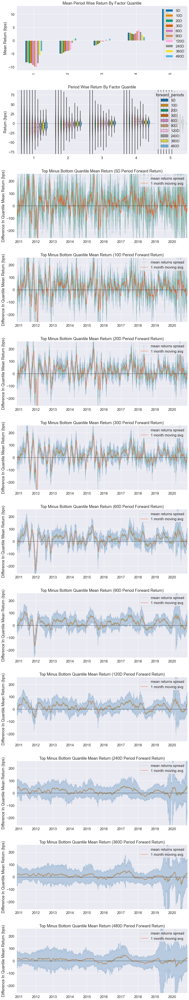

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

Information Analysis


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
IC Mean,0.011,0.014,0.020,0.023,0.039,0.053,0.063,0.070,0.055,0.042
IC Std.,0.121,0.126,0.132,0.137,0.138,0.127,0.118,0.105,0.101,0.094
Risk-Adjusted IC,0.087,0.113,0.150,0.166,0.280,0.421,0.537,0.668,0.544,0.446
t-stat(IC),NaN,NaN,9.089,10.045,16.978,25.516,32.520,40.462,32.961,27.021
p-value(IC),NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
IC Skew,NaN,NaN,-0.443,-0.529,-0.796,-0.692,-0.190,0.051,-0.097,-0.202
IC Kurtosis,NaN,NaN,1.767,1.758,2.488,2.641,0.261,-0.259,-0.451,-0.434


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

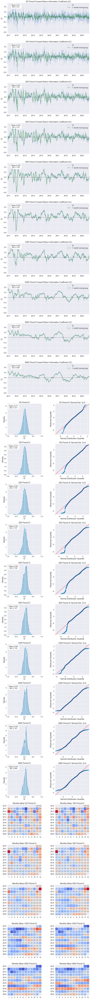

/opt/anaconda3/lib/python3.9/site-packages/alphalens/utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Quantile 1 Mean Turnover,0.094,0.133,0.189,0.233,0.328,0.396,0.454,0.636,0.685,0.703
Quantile 2 Mean Turnover,0.223,0.305,0.405,0.472,0.581,0.637,0.675,0.760,0.786,0.797
Quantile 3 Mean Turnover,0.249,0.337,0.442,0.510,0.613,0.665,0.699,0.759,0.771,0.770
Quantile 4 Mean Turnover,0.204,0.282,0.382,0.450,0.566,0.631,0.673,0.760,0.777,0.792
Quantile 5 Mean Turnover,0.084,0.120,0.172,0.215,0.312,0.389,0.456,0.680,0.757,0.779


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Mean Factor Rank Autocorrelation,0.979,0.96,0.923,0.886,0.784,0.691,0.599,0.235,0.105,0.063


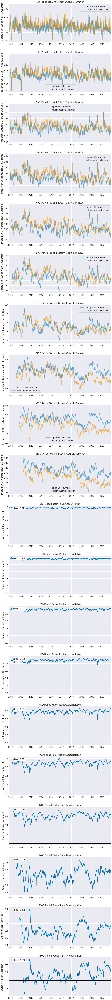

In [62]:
# 不受periods控制，自動變成7, 14....，當prices還沒sorted就fillna

factor_data = get_clean_factor_and_forward_returns(
    MOM.stack(),
    prices,
#     quantiles=4,
    periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
#    filter_zscore=None)

create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

Dropped 13.0% entries from factor data: 13.0% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


/opt/anaconda3/lib/python3.9/site-packages/seaborn/rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-763602.662439,-13.530568,-1571.952078,15487.572711,695311,20.042558
2,-149.517011,-3.608883,-21.631524,17.425566,693144,19.980093
3,-28.139420,-1.267063,-5.465201,3.464165,693042,19.977153
4,-8.433426,-0.405093,-1.690114,1.031999,693144,19.980093
5,-2.340134,-0.001003,-0.382862,0.330922,694532,20.020103


Returns Analysis


/opt/anaconda3/lib/python3.9/site-packages/alphalens/plotting.py:138: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  returns_table = returns_table.append(alpha_beta)


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Ann. alpha,0.009,0.009,0.010,0.012,0.016,0.021,0.024,0.028,0.023,0.019
beta,-0.183,-0.123,-0.090,-0.102,-0.126,-0.114,-0.078,0.072,0.106,0.178
Mean Period Wise Return Top Quantile (bps),2.020,2.397,2.972,3.385,4.129,4.676,5.312,7.586,8.936,8.803
Mean Period Wise Return Bottom Quantile (bps),-3.250,-3.721,-4.472,-5.005,-6.224,-7.237,-7.872,-10.466,-11.852,-12.443
Mean Period Wise Spread (bps),5.270,6.151,7.479,8.424,10.367,11.926,13.183,17.981,20.691,21.278


/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:381: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < "3.0":
/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


<Figure size 432x288 with 0 Axes>

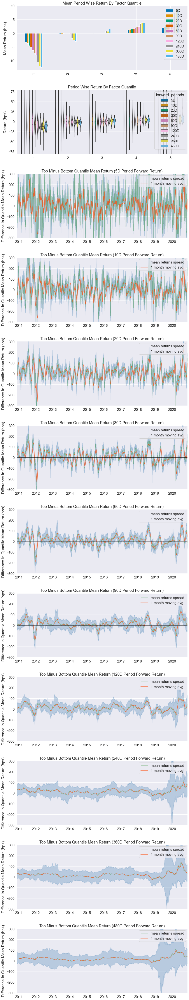

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

Information Analysis


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
IC Mean,0.019,0.022,0.029,0.035,0.051,0.066,0.077,0.118,0.146,0.162
IC Std.,0.137,0.136,0.134,0.139,0.141,0.134,0.128,0.105,0.102,0.091
Risk-Adjusted IC,0.136,0.164,0.213,0.250,0.362,0.492,0.602,1.118,1.436,1.768
t-stat(IC),NaN,NaN,12.877,15.131,21.908,29.800,36.453,67.670,86.931,107.063
p-value(IC),NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
IC Skew,NaN,NaN,-0.272,-0.250,-0.383,-0.420,-0.263,-0.222,-0.637,-0.552
IC Kurtosis,NaN,NaN,0.039,0.132,0.576,0.540,-0.059,-0.537,-0.131,-0.225


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

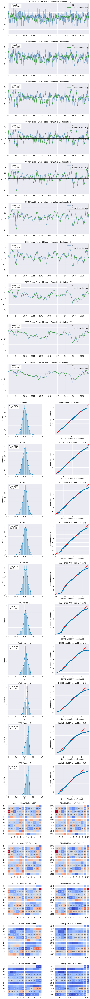

/opt/anaconda3/lib/python3.9/site-packages/alphalens/utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Quantile 1 Mean Turnover,0.014,0.027,0.051,0.074,0.135,0.185,0.226,0.318,0.366,0.410
Quantile 2 Mean Turnover,0.033,0.063,0.120,0.173,0.305,0.401,0.471,0.589,0.622,0.646
Quantile 3 Mean Turnover,0.041,0.078,0.148,0.211,0.359,0.461,0.533,0.650,0.672,0.692
Quantile 4 Mean Turnover,0.039,0.075,0.141,0.201,0.342,0.438,0.504,0.621,0.648,0.668
Quantile 5 Mean Turnover,0.018,0.034,0.065,0.093,0.165,0.221,0.265,0.364,0.399,0.427


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Mean Factor Rank Autocorrelation,0.999,0.998,0.993,0.985,0.957,0.926,0.895,0.813,0.775,0.741


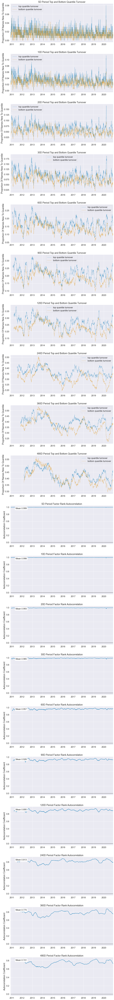

In [70]:
# 不受periods控制，自動變成7, 14....，當prices還沒sorted就fillna

factor_data = get_clean_factor_and_forward_returns(
    VOL.stack(),
    prices,
#     quantiles=4,
    periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
#    filter_zscore=None)

create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## 價值因子指標

In [68]:
value_index = CTP + EB + EP

# 取出排名

In [63]:
# 3 5 8 11
# 4 6 9 12
# 2010~2019

# factor = 'CTP'
# factor = 'EB'
# factor = 'EP'
# factor = 'VOL'


observed_time = []

for i in range(2010, 2023):
    for j in [4, 6, 9, 12]:
        observed_time.append(datetime.date(i, j, 1) - datetime.timedelta(days=1))
        
# observed_time = pd.to_datetime(observed_time).dt.date
observed_time  = pd.Index(observed_time[1:])
observed_time  = observed_time.astype('datetime64[ns]')

In [64]:
observed_time 

DatetimeIndex(['2010-05-31', '2010-08-31', '2010-11-30', '2011-03-31',
               '2011-05-31', '2011-08-31', '2011-11-30', '2012-03-31',
               '2012-05-31', '2012-08-31', '2012-11-30', '2013-03-31',
               '2013-05-31', '2013-08-31', '2013-11-30', '2014-03-31',
               '2014-05-31', '2014-08-31', '2014-11-30', '2015-03-31',
               '2015-05-31', '2015-08-31', '2015-11-30', '2016-03-31',
               '2016-05-31', '2016-08-31', '2016-11-30', '2017-03-31',
               '2017-05-31', '2017-08-31', '2017-11-30', '2018-03-31',
               '2018-05-31', '2018-08-31', '2018-11-30', '2019-03-31',
               '2019-05-31', '2019-08-31', '2019-11-30', '2020-03-31',
               '2020-05-31', '2020-08-31', '2020-11-30', '2021-03-31',
               '2021-05-31', '2021-08-31', '2021-11-30', '2022-03-31',
               '2022-05-31', '2022-08-31', '2022-11-30'],
              dtype='datetime64[ns]', freq=None)

In [69]:
# 額外輸出factor_value

def export(df, name):
    df = df.loc[df.index.isin(observed_time), :]
    df.T.to_excel(writer, sheet_name=name)
    print(df)

writer = pd.ExcelWriter('./計算溢酬/CTBCdata/factorvalues.xlsx', engine='xlsxwriter')
export(CTP, 'CTP')
export(EB, 'EB')
export(EP, 'EP')
export(VOL, 'VOL')
export(Mom, 'MOM')
export(value_index, 'value_index')
writer.save()

                1101      1102      1103      1104      1108      1109  \
2010-05-31  0.521585  0.277639  0.182145  0.302468  0.409960  0.173964   
2010-08-31  0.989873  0.526427  0.337793  0.385392  0.767643  0.321346   
2010-11-30  1.457303  0.761254  0.516917  0.522012  1.144745  0.456233   
2011-03-31  1.286942  0.695612  0.486145  0.501135  1.172467  0.439923   
2011-05-31  0.363964  0.219189  0.188391  0.190503  0.439317  0.567950   
2011-08-31  0.846545  0.471768  0.357907  0.439545  1.040484  0.308336   
2011-11-30  1.547800  0.871990  0.652392  0.729854  1.965341  0.500812   
2012-03-31  1.966950  1.088223  0.894491  0.941478  1.813647  0.818288   
2012-05-31  2.013566  1.097379  0.921597  1.015812  2.361751  0.837869   
2012-08-31  1.975742  1.038988  0.875037  0.972938  2.278588  0.806212   
2012-11-30  1.690157  0.956925  0.871759  0.862308  2.249781  0.802393   
2013-03-31  1.714951  0.980554  0.885022  0.722209  1.964317  0.810068   
2013-05-31  0.347981  0.179393  0.1521

                1101      1102      1103      1104      1108      1109  \
2010-05-31  0.020288  0.021176  0.005249 -0.000710  0.010749  0.013234   
2010-08-31  0.049944  0.043295  0.004371  0.042228  0.021650  0.024353   
2010-11-30  0.078819  0.056954  0.030443  0.085344  0.027648  0.026703   
2011-03-31  0.078819  0.056954  0.030443  0.085344  0.027648  0.026703   
2011-05-31  0.022206  0.026922  0.027554  0.011908  0.003654  0.026708   
2011-08-31  0.049200  0.054218  0.053635  0.014926  0.012776  0.010910   
2011-11-30  0.085930  0.091353  0.039161  0.037315  0.023203  0.017268   
2012-03-31  0.113232  0.115446  0.064475  0.060286  0.023203  0.047587   
2012-05-31  0.113232  0.115446  0.064475  0.060286  0.044632  0.047587   
2012-08-31  0.113232  0.115446  0.064475  0.060286  0.044632  0.047587   
2012-11-30  0.113232  0.115446  0.064475  0.060286  0.044632  0.047587   
2013-03-31  0.113232  0.115446  0.064475  0.060286  0.044632  0.047587   
2013-05-31  0.020484  0.016700  0.0200

                1101      1102      1103      1104      1108      1109  \
2010-05-31  0.121507  0.096618       NaN  0.069444  0.005799  0.015263   
2010-08-31  0.134953  0.098522       NaN  0.111857  0.005799  0.015263   
2010-11-30  0.114943  0.077760  0.005202  0.097943  0.005799  0.015263   
2011-03-31  0.114943  0.077760  0.005202  0.097943  0.005799  0.015263   
2011-05-31  0.111857  0.100604  0.028711  0.092851  0.005799  0.015263   
2011-08-31  0.101317  0.090171  0.047015  0.040667  0.005799  0.015263   
2011-11-30  0.130378  0.115207  0.063532  0.065488  0.005799  0.015263   
2012-03-31  0.106383  0.102459  0.088417  0.050942  0.005799  0.018801   
2012-05-31  0.106383  0.102459  0.088417  0.050942  0.005799  0.018801   
2012-08-31  0.106383  0.102459  0.088417  0.050942  0.005799  0.018801   
2012-11-30  0.106383  0.102459  0.088417  0.050942  0.005799  0.018801   
2013-03-31  0.106383  0.102459  0.088417  0.050942  0.005799  0.018801   
2013-05-31  0.100604  0.088652  0.0641

                 1101       1102      1103      1104      1108      1109  \
2010-05-31        NaN        NaN       NaN       NaN       NaN       NaN   
2010-08-31        NaN        NaN       NaN       NaN       NaN       NaN   
2010-11-30  -1.941167  -1.344036 -0.611166 -1.465391 -0.073766 -0.037320   
2011-03-31  -0.699414  -0.442162 -0.298396 -0.803773 -0.030445 -0.020319   
2011-05-31  -2.069949  -1.599157 -0.328939 -0.289181 -0.035127 -0.049246   
2011-08-31  -6.464586  -6.109253 -0.495399 -0.196694 -0.074094 -0.130273   
2011-11-30  -3.748853  -3.597381 -1.055553 -0.659480 -0.234616 -0.083496   
2012-03-31  -3.204641  -2.770292 -2.357305 -0.515932 -0.172096 -0.063211   
2012-05-31  -0.638106  -1.088067 -0.883308 -0.189980 -0.054068 -0.031897   
2012-08-31  -0.426491  -0.938473 -0.282802 -0.181722 -0.065205 -0.028154   
2012-11-30  -0.938714  -1.279053 -0.282610 -0.231031 -0.021069 -0.027442   
2013-03-31  -0.855843  -0.414882 -0.188271 -1.047180 -0.090609 -0.014514   
2013-05-31  

                1101      1102      1103      1104      1108      1109  \
2010-05-31       NaN       NaN       NaN       NaN       NaN       NaN   
2010-08-31       NaN       NaN       NaN       NaN       NaN       NaN   
2010-11-30  0.089147  0.056288  0.040861  0.104518  0.008807  0.025644   
2011-03-31  0.164172  0.118189  0.117534  0.189891  0.033522  0.044844   
2011-05-31  0.171487  0.146974  0.088502  0.075279  0.031643  0.062179   
2011-08-31  0.135882  0.158098  0.084118 -0.065014 -0.061134  0.032104   
2011-11-30  0.091273  0.094353 -0.059010 -0.089868 -0.112105  0.058135   
2012-03-31 -0.088958 -0.056711 -0.133018 -0.097887 -0.088157 -0.005063   
2012-05-31  0.002101  0.030269 -0.132590 -0.056548 -0.035100  0.018118   
2012-08-31  0.033131  0.103027  0.076611  0.017514  0.079192  0.027745   
2012-11-30  0.079343  0.088973  0.010378  0.029088  0.027992  0.006319   
2013-03-31  0.058029  0.037004  0.016303  0.188948  0.098915  0.021036   
2013-05-31  0.115939  0.051072  0.0490

                1101      1102      1103      1104      1108      1109  \
2010-05-31  0.663380  0.395432       NaN  0.371203  0.426508  0.202461   
2010-08-31  1.174770  0.668244       NaN  0.539477  0.795092  0.360962   
2010-11-30  1.651064  0.895969  0.552562  0.705299  1.178192  0.498199   
2011-03-31  1.480703  0.830327  0.521790  0.684423  1.205914  0.481889   
2011-05-31  0.498026  0.346715  0.244656  0.295261  0.448770  0.609921   
2011-08-31  0.997062  0.616157  0.458557  0.495138  1.059059  0.334509   
2011-11-30  1.764108  1.078551  0.755085  0.832656  1.994344  0.533342   
2012-03-31  2.186565  1.306128  1.047383  1.052706  1.842649  0.884675   
2012-05-31  2.233181  1.315283  1.074489  1.127040  2.412182  0.904256   
2012-08-31  2.195357  1.256893  1.027929  1.084166  2.329019  0.872600   
2012-11-30  1.909773  1.174830  1.024651  0.973536  2.300212  0.868780   
2013-03-31  1.934567  1.198459  1.037914  0.833437  2.014748  0.876456   
2013-05-31  0.469068  0.284745  0.2363

In [45]:
np.argpartition(np.array([9, 4, 4, 3, 3, 9, 0, 4, 6, 0]), -4)[-4:]

array([1, 5, 8, 0])

In [82]:
# CTP = CTP.unstack()
def group(factor_df, name):
    high_group = pd.DataFrame()
    low_group = pd.DataFrame()

    for i in observed_time:
        values = factor_df.loc[i, :].values
        values = values[~np.isnan(values)]
        num = round(len(values)/5)
        top_index = factor_df.columns[ np.argpartition(values, -num)[-num:] ]
        low_index = factor_df.columns[ np.argpartition(values, num)[0:num] ]

        df = pd.DataFrame({i:top_index})
        high_group = pd.concat([high_group, df], ignore_index=True, axis=1)
        df = pd.DataFrame({i:low_index})
        low_group = pd.concat([low_group, df], ignore_index=True, axis=1)

    high_group.columns = observed_time
    low_group.columns = observed_time
#     print(high_group)
    high_group.to_csv('./計算溢酬/data_Processed/High_' + name + '.csv')
    low_group.to_csv('./計算溢酬/data_Processed/Low_' + name + '.csv')

In [83]:
group(value_index, 'value_index')
group(CTP, 'CTP')
group(EB, 'EB')
group(EP, 'EP')
group(VOL, 'VOL')

In [151]:
# high_group

,2010-05-31,2010-08-31,2010-11-30,2011-03-31,2011-05-31,2011-08-31,2011-11-30,2012-03-31,2012-05-31,2012-08-31,...,2017-08-31,2017-11-30,2018-03-31,2018-05-31,2018-08-31,2018-11-30,2019-03-31,2019-05-31,2019-08-31,2019-11-30
0,2455,2723,3607,3428,3227,2020,3686,5508,4142,3211,...,6620,2361,6146,1535,8008,1598,2455,3533,5217,8155
1,3702,3712,1219,3024,3583,3019,5347,5536,3130,2377,...,4163,1310,6409,2704,5315,6203,6188,1569,1904,1402
2,2227,2615,1419,3688,3372,5305,2731,4763,1708,5261,...,2376,2376,1231,1608,1604,2109,3514,1523,1451,2402
3,2464,3481,3024,2365,5257,4117,3645,2406,1569,2341,...,5315,3697,6169,8101,4142,3647,2349,3566,6469,2449
4,2466,2437,3538,3679,1314,3711,3712,2340,2433,4733,...,6617,2458,4128,6536,2601,2360,2352,2325,6188,8329
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,8249,2926,2012,1715,3260,3221
197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,2020,2382,4702,1716,3339,3265
198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2014,1725,1304,3260
199,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,4551,8415,3265,8427


In [154]:
# high_group.to_csv('./計算溢酬/data_Processed/High_Value_2.csv')
# low_group.to_csv('./計算溢酬/data_Processed/Low_Value_2.csv')